# Notebook to fine-tune Segment Anything Model (SAM)
Sections
- 00 Installation and define Variables
- 01 Define functions and classes for fine-tuning
- 02 Plan for fine-tuning
- 03 Define models and classes for fine-tuning
- 04 Fine-tuning



## 00 Installing packages and defining variables
The code in this section will import everything needed and define the global variables.
- install packages
- define variables
- adjust for your data


## Acknowledgments:

- [Max Joas](https://maxjoas.medium.com/finetune-segment-anything-sam-for-images-with-multiple-masks-34514ee811bb)



### 00 Install segment anything and login to wandb

In [40]:

#!pip install segment_anything
# wandb login API key


### Import packages

In [41]:


from segment_anything import SamAutomaticMaskGenerator, sam_model_registry, SamPredictor
import glob
import matplotlib.pyplot as plt
from pycocotools.coco import COCO

import json
import toml
import os
import datetime

import cv2
import matplotlib.pyplot as plt
import numpy as np

import torchvision.transforms as transforms
from pycocotools.coco import COCO
from segment_anything import sam_model_registry
from segment_anything.utils.transforms import ResizeLongestSide
from torch.utils.data import DataLoader, Dataset
import logging
import sys
import torch
import torch.nn as nn
import torch.nn.functional as F

import wandb

### Define variables
In this section, we'll define global variables.

To use data on Google Drive, we first need to mount Google Drive like so:

In [42]:
# from google.colab import drive
# drive.mount('/content/drive')

In [43]:

from torch.types import Device
# data
global train
global test
global annot

# sample_path = '/home/tova/thesis/SAM_bboxes/train/patch_0_8192_png.rf.efedeaf591f42ea53546d5290a38e5a8.jpg'
# train_path = '/media/tova/Memento Mori/inria_dataset/AerialImageDataset/train/image_patches'
# test_path = '/media/tova/Memento Mori/inria_dataset/AerialImageDataset/valid/image_patches'

sample_path = '/home/tova/thesis/SAM_bboxes/train/patch_0_8192_png.rf.efedeaf591f42ea53546d5290a38e5a8.jpg'
train_path = '/home/tova/thesis/SAM_bboxes/train'
test_path = '/home/tova/thesis/SAM_bboxes/test' # Modify code to use this path for test inference runs
valid_path = '/home/tova/thesis/SAM_bboxes/valid' # Modify code to use this path for validation runs


model_path = '/home/tova/thesis/SAM_bboxes/models/sam_vit_h_4b8939.pth'
saved_model_path = '/home/tova/thesis/SAM_bboxes/models/model_test_focal_dice_1_epc.pth'
annot = '_annotations.coco.json'
#model
global batch_size
global epochs
global lr
global weight_decay
global DEVICE

batch_size =1
epochs = 5
lr = 0.001
weight_decay = 0.0005
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(DEVICE)

# loss
global alpha
global gamma
alpha = 0.8
gamma = 2

# Initialize wandb
wandb.init(
    # set the wandb project where this run will be logged
    project="Thesis_test",

    # track hyperparameters and run metadata
    config={
    "learning_rate": lr,
    "weight_decay": weight_decay,
    "architecture": "Segment Anything Model",
    "dataset": "Custom building footprint dataset",
    "epochs": epochs,
    "batch_size": batch_size,
    }
)

cuda


Create directory for SAM models and download Segment Anything Model weights

In [44]:
# !mkdir -p {HOME}/content/drive/MyDrive/ColabNotebooks/models/SAM/
#!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -P /content/drive/MyDrive/ColabNotebooks/models/SAM/

## 01 Define models and classes for fine-tuning
We'll define some functions and classes here:
- Class COCODataset: helper to read in the annotations.json in coco format
- class ResizeAndPad: helper to preprocess images to fit the expected size from SAM
- load_datasets: function to get annotated COCO images into PyTorch dataloader


In [45]:
class COCODataset(Dataset):
    """
    A PyTorch Dataset to load data from a json file in COCO format.

    ...
    Attributes
    ----------
    root_dir : str
        the root directory containing the images and annotations
    annotation_file : str
        name of the json file containing the annotations (in root_dir)
    transform : callable
        a function/transform to apply to each image

    Methods
    -------
    __getitem__(idx)
        returns the image, image path, and masks for the given index
    buid_total_mask(masks)
        combines the masks into a single mask
    """


    def __init__(self, root_dir, annotation_file, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.coco = COCO(annotation_file)
        self.image_ids = list(self.coco.imgs.keys())

        # Filter out image_ids without any annotations
        self.image_ids = [image_id for image_id in self.image_ids if len(self.coco.getAnnIds(imgIds=image_id)) > 0]

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        image_info = self.coco.loadImgs(image_id)[0]
        image_path = os.path.join(self.root_dir, image_info['file_name'])
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        ann_ids = self.coco.getAnnIds(imgIds=image_id)
        anns = self.coco.loadAnns(ann_ids)
        bboxes = []
        masks = []

        for ann in anns:
            x, y, w, h = ann['bbox']
            bboxes.append([x, y, x + w, y + h])
            mask = self.coco.annToMask(ann)
            masks.append(mask)

        if self.transform:
            image, masks, bboxes = self.transform(image, masks, np.array(bboxes))

        bboxes = np.stack(bboxes, axis=0)
        masks = np.stack(masks, axis=0)
        return image, image_path, torch.tensor(masks).float()


class ResizeAndPad:
    """
    Resize and pad images and masks to a target size.

    ...
    Attributes
    ----------
    target_size : int
        the target size of the image
    transform : ResizeLongestSide
        a transform to resize the image and masks
    """

    def __init__(self, target_size):
        self.target_size = target_size
        self.transform = ResizeLongestSide(target_size)
        self.to_tensor = transforms.ToTensor()

    def __call__(self, image, masks, bboxes):
        # Resize image and masks
        og_h, og_w, _ = image.shape
        image = self.transform.apply_image(image)
        masks = [torch.tensor(self.transform.apply_image(mask)) for mask in masks]
        image = self.to_tensor(image)

        # Pad image and masks to form a square
        _, h, w = image.shape
        max_dim = max(w, h)
        pad_w = (max_dim - w) // 2
        pad_h = (max_dim - h) // 2

        padding = (pad_w, pad_h, max_dim - w - pad_w, max_dim - h - pad_h)
        image = transforms.Pad(padding)(image)
        masks = [transforms.Pad(padding)(mask) for mask in masks]

        # Adjust bounding boxes
        bboxes = self.transform.apply_boxes(bboxes, (og_h, og_w))
        bboxes = [[bbox[0] + pad_w, bbox[1] + pad_h, bbox[2] + pad_w, bbox[3] + pad_h] for bbox in bboxes]

        return image, masks, bboxes


def load_datasets(img_size):
    """ load the training and validation datasets in PyTorch DataLoader objects
    ARGS:
        img_size (Tuple(int, int)): image size
    RETURNS:
        train_dataloader (DataLoader): training dataset
        val_dataloader (DataLoader): validation dataset

    """
    transform = ResizeAndPad(img_size)
    traindata = COCODataset(root_dir=train_path, annotation_file=os.path.join(train_path, annot), transform=transform)
    valdata = COCODataset(root_dir=valid_path, annotation_file=os.path.join(valid_path, annot), transform=transform)
    testdata = COCODataset(root_dir=test_path, annotation_file=os.path.join(test_path, annot), transform=transform)
    train_dataloader = DataLoader(traindata,
                                  batch_size=batch_size,
                                  shuffle=True,
                                  num_workers=1)
    val_dataloader = DataLoader(valdata,
                                batch_size=batch_size,
                                shuffle=True,
                                num_workers=1)
    test_dataloader = DataLoader(testdata,
                                batch_size=batch_size,
                                shuffle=True,
                                num_workers=1)
    return train_dataloader, val_dataloader, test_dataloader



### Summary functions and classes:
Now we have transformed our images and coco annotations to torch tensors, that we can use for training. For fine-tuning SAM, we need to define a Neural net with PyTorch first, we do this in the next class.

In [46]:
import torch.nn as nn
class ModelSimple(nn.Module):

    """
    Wrapper for the sam model to fine-tune the model on a new dataset

    Attributes:
    -----------
    freeze_encoder (bool): freeze the encoder weights
    freeze_decoder (bool): freeze the decoder weights
    freeze_prompt_encoder (bool): freeze the prompt encoder weights
    transform (ResizeLongestSide): resize the images to the model input size

    Methods:
    --------
    setup(): load the model and freeze the weights
    forward(images, points): forward pass of the model, returns the masks and iou_predictions
    """

    def __init__(self, freeze_encoder=True, freeze_prompt_encoder=True, freeze_decoder=False):
        super().__init__()
        self.freeze_encoder = freeze_encoder
        self.freeze_decoder = freeze_decoder
        self.freeze_prompt_encoder = freeze_prompt_encoder
        # we need this to make the input image size compatible with the model
        self.transform = ResizeLongestSide(1024) #This is 1024, because sam was trained on 1024x1024 images

    def setup(self):
        self.model = sam_model_registry['vit_h'](model_path)
        # to speed up training time, we normally freeze the encoder and decoder
        if self.freeze_encoder:
            for param in self.model.image_encoder.parameters():
                param.requires_grad = False
        if self.freeze_prompt_encoder:
            for param in self.model.prompt_encoder.parameters():
                param.requires_grad = False
        if self.freeze_decoder:
            for param in self.model.mask_decoder.parameters():
                param.requires_grad = False
        self.transform = ResizeLongestSide(self.model.image_encoder.img_size)
    def forward(self, images, points):
        _, _, H, W = images.shape # batch, channel, height, width
        image_embeddings = self.model.image_encoder(images) # shape: (1, 256, 64, 64)
        # get point prompt embeddings
        if points == None:
            sparse_embeddings, dense_embeddings = self.model.prompt_encoder(
                points=None,
                boxes=None,
                masks=None,
        )
        else:
            sparse_embeddings, dense_embeddings = self.model.prompt_encoder(
            points=points,
            boxes=None,
            masks=None,
        )

        # get low resolution masks and iou predictions
        # multimask_output=False means that we only get one mask per image,
        # otherwise we would get three masks per image
        low_res_masks, iou_predictions = self.model.mask_decoder(
            image_embeddings=image_embeddings,
            image_pe=self.model.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse_embeddings, # sparse_embeddings shape: (1, 0, 256)
            dense_prompt_embeddings=dense_embeddings, # dense_embeddings shape: (1, 256, 256)
            multimask_output=False,
        )
        # postprocess the masks to get the final masks and resize them to the original image size
        masks = F.interpolate(
            low_res_masks, # shape: (1, 1, 256, 256)
            (H, W),
            mode="bilinear",
            align_corners=False,
        )
        # shape masks after interpolate: torch.Size([1, 1, 1024, 1024])
        return masks, iou_predictions

## 02 Plan for fine-tuning
We'll use the SAM model directly to output a 1024,1024 mask. This will be a probability map of the location of masks. As you see in line 45 above we don't provide any prompts. We do this to save us work with the postprocessing. To get all our masks for the image, we'll just put our ground truth masks (all masks for one image) in the loss function. So that we'll force the model to output high values for areas with masks.

For the loss function, we use the same as the authors of the SAM paper:

Quote from Sam Paper
```
Losses. We supervise mask prediction with a linear combination of focal loss [65] and dice loss [73] in a 20:1 ratio of
focal loss to dice loss, following [20, 14]. Unlike [20, 14],
we observe that auxiliary deep supervision after each decoder layer is unhelpful. The IoU prediction head is trained
with mean-square-error loss between the IoU prediction and
the predicted mask's IoU with the ground truth mask. It is
added to the mask loss with a constant scaling factor of 1.0.
```
We won't train the IoU prediction head in our case.

## 03 Models, classes functions for fine-tuning
We'll define the following classes and functions to fine-tune SAM:
- get_totalmask (function): combines all single object masks into one mask per image
- remove_small_regions (function): removes small holes in masks and disconnected "islands" 
- FocalLoss (class): to calculate Focalloss
- DiceLoss (class): to calculate Diceloss
- IoU (function): Calculates Intersection over union for given image
- dice_coef (function): Calculates dice coefficient for given image
- criterion (function): combines Dice- and Focalloss. This is our final loss function
- train_one_epoch(function): calculates loss for each batch
- train (function) calls train_one_epoch for each epoch and calculates validation loss

In [47]:
import torch.nn as nn
import torch.nn.functional as F
import torch
from typing import Tuple

def get_totalmask(masks):
    """get all masks in to one image
    ARGS:
        masks (torch.Tensor): shape: (N, H, W) where N is the number of masks
                              masks H,W is usually 1024,1024
    RETURNS:
        total_gt (torch.Tensor): all masks in one image

    """
    total_gt = torch.zeros_like(masks[0,:,:])
    for k in range(len(masks)):
        total_gt += masks[k,:,:]
    return total_gt

def remove_small_regions(
mask: np.ndarray, area_thresh: float, mode: str
) -> Tuple[np.ndarray, bool]:
    """
    Removes small disconnected regions and holes in a mask. Returns the
    mask and an indicator of if the mask has been modified.
    """
    import cv2

    assert mode in ["holes", "islands"]
    correct_holes = mode == "holes"
    working_mask = (correct_holes ^ mask).astype(np.uint8)
    n_labels, regions, stats, _ = cv2.connectedComponentsWithStats(working_mask, 8)
    sizes = stats[:, -1][1:]  # Row 0 is background label
    small_regions = [i + 1 for i, s in enumerate(sizes) if s < area_thresh]
    if len(small_regions) == 0:
        return mask, False
    fill_labels = [0] + small_regions
    if not correct_holes:
        fill_labels = [i for i in range(n_labels) if i not in fill_labels]
        # If every region is below threshold, keep largest
        if len(fill_labels) == 0:
            fill_labels = [int(np.argmax(sizes)) + 1]
    mask = np.isin(regions, fill_labels)
    return mask, True


class FocalLoss(nn.Module):
    """ Computes the Focal loss. """

    def __init__(self):
        super().__init__()

    def forward(self, inputs, targets):

        inputs = inputs.flatten(0,2)
        BCE = F.binary_cross_entropy_with_logits(inputs, targets, reduction='mean')
        BCE_EXP = torch.exp(-BCE)
        focal_loss = alpha * (1 - BCE_EXP)**gamma * BCE

        return focal_loss


class DiceLoss(nn.Module):
    """ Computes the Dice loss. """

    def __init__(self):
        super().__init__()

    def forward(self, inputs, targets, smooth=1):
        inputs = F.sigmoid(inputs)
        inputs = inputs.flatten(0,2)
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + smooth) / \
            (inputs.sum() + targets.sum() + smooth)
        return 1 - dice


def IoU(groundtruth_mask,pred_mask):
    """Computes Intersection Over Union"""

    intersect = np.sum(pred_mask*groundtruth_mask)
    union = np.sum(pred_mask) + np.sum(groundtruth_mask) - intersect
    iou = np.mean(intersect/union)
    return round(iou,3)

def dice_coef(groundtruth_mask, pred_mask):
    """Computes Dice coefficient"""
    intersect = np.sum(pred_mask*groundtruth_mask)
    total_sum = np.sum(pred_mask) + np.sum(groundtruth_mask)
    dice = np.mean(2*intersect/total_sum)
    return round(dice, 3)


def criterion(x, y):
    """ Combined dice and focal loss.
    ARGS:
        x: (torch.Tensor) the model output
        y: (torch.Tensor) the target
    RETURNS:
        (torch.Tensor) the combined loss

    """
    focal, dice = FocalLoss(), DiceLoss()
    y = y.to(DEVICE)
    x = x.to(DEVICE)
    return 20 * focal(x, y) + dice(x, y)


def train_one_epoch(model, trainloader, optimizer, epoch_idx):
    """ Runs forward and backward pass for one epoch and returns the average
    batch loss for the epoch.
    ARGS:
        model: (nn.Module) the model to train
        trainloader: (torch.utils.data.DataLoader) the dataloader for training
        optimizer: (torch.optim.Optimizer) the optimizer to use for training
        epoch_idx: (int) the index of the current epoch
        tb_writer: (torch.utils.tensorboard.writer.SummaryWriter) the tensorboard writer
    RETURNS:
        last_loss: (float) the average batch loss for the epoch

    """
    running_loss = 0.
    for i, (image, path, masks) in enumerate(trainloader):
        # if i % 3 == 0: # Reduce training dataset size
        image = image.to(DEVICE)
        optimizer.zero_grad()
        pred, _ = model(image,points=None)
        masks = masks[0].to(DEVICE)
        total_mask = get_totalmask(masks)
        pred = pred.to(DEVICE)
        loss = criterion(pred, total_mask)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        wandb.log({
        "epoch_train": epoch_idx + 1,
        "train_loss": loss.item()
    })


    i = len(trainloader)
    last_loss = running_loss / i
    print(f'batch_loss for batch {i}: {last_loss}')
    running_loss = 0.



    return last_loss


def train():
    """ Trains the model for the given number of epochs."""
    bestmodel_path = ""
    model = ModelSimple()
    model.setup()
    model.to(DEVICE)
    img_size = model.model.image_encoder.img_size
    trainloader, validloader = load_datasets(img_size=img_size)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    best_valid_loss = float('inf')
    for epch in range(epochs): # type: ignore
        running_vloss = 0.
        model.train(True)
        avg_batchloss = train_one_epoch(
            model, trainloader, optimizer, epch)
        if not eval: # type: ignore
            continue
        with torch.inference_mode():
            for images, path, masks in validloader:
                model.to(DEVICE)
                images = images.to(DEVICE)
                masks = masks[0].to(DEVICE)
                total_mask = get_totalmask(masks)
                total_mask = total_mask.to(DEVICE)
                model.eval()
                preds, iou = model(images, points=None)
                preds_device = preds.to(DEVICE)
                vloss = criterion(preds_device, total_mask)
                running_vloss += vloss.item()

                wandb.log({
                "epoch_val": epch + 1,
                "validation_loss": vloss.item()
                })


        # DEBUG: print what comes out of model and compare with GT
        # DEBUG: Get pred numpy array and print it for debug
        pred_np = preds.detach().cpu().numpy().squeeze()
        print(f"model output as numpy array{pred_np.shape}")
        total_mask_np = total_mask.detach().cpu().numpy().squeeze()
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))

        # Plot the first image on the left
        axes[0].imshow(total_mask_np)  # Assuming the first image is grayscale
        axes[0].set_title("GT Total mask")

        # Plot the second image on the right
        axes[1].imshow(pred_np)  # Assuming the second image is grayscale
        axes[1].set_title("Output")

        # Hide axis ticks and labels
        for ax in axes:
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xticklabels([])
            ax.set_yticklabels([])

        # Display the images side by side
        plt.show()

        print(f'epoch: {epch}, validloss: {running_vloss}')
        avg_vloss = running_vloss / len(validloader)
        # save model
        print(f'epoch: {epch}, validloss: {running_vloss}')
        print(f'best valid loss: {best_valid_loss}')
        if running_vloss < best_valid_loss:
          best_model = model

    wandb.finish()

    return model




## 04 Fine-tuning

Training the model on Colab might run out of RAM. We will be training the model on Ubuntu 22.04 + RTX 3090.

### Train:



loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
batch_loss for batch 169: 1.7900527676446198
model output as numpy array(1024, 1024)


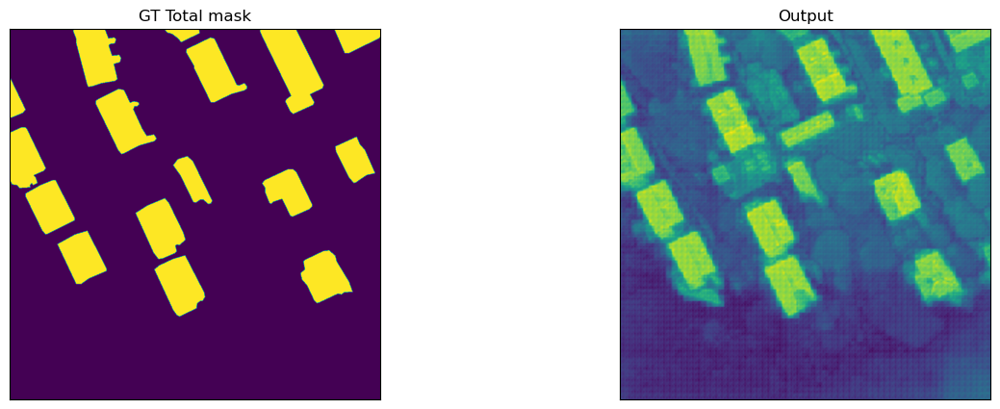

epoch: 0, validloss: 22.111215233802795
epoch: 0, validloss: 22.111215233802795
best valid loss: inf
batch_loss for batch 169: 1.0353380487515376
model output as numpy array(1024, 1024)


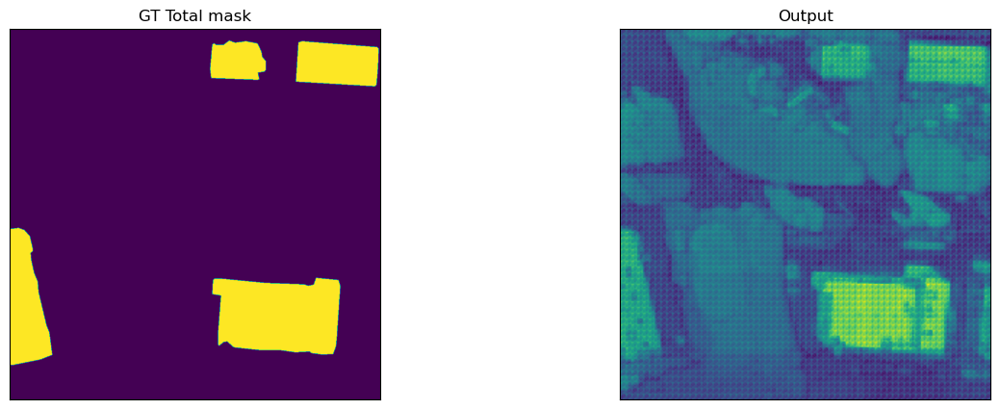

epoch: 1, validloss: 30.47974067926407
epoch: 1, validloss: 30.47974067926407
best valid loss: inf
batch_loss for batch 169: 0.7289096263386089
model output as numpy array(1024, 1024)


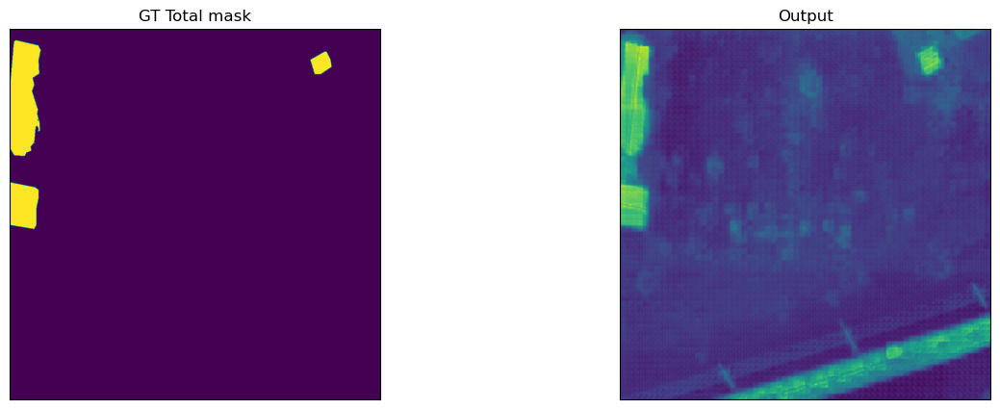

epoch: 2, validloss: 5.688034757971764
epoch: 2, validloss: 5.688034757971764
best valid loss: inf
batch_loss for batch 169: 0.5655304216421567
model output as numpy array(1024, 1024)


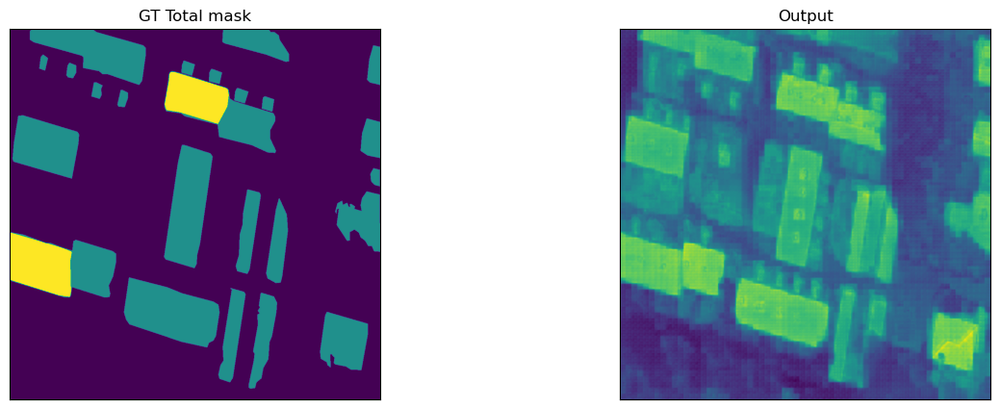

epoch: 3, validloss: 7.5540885627269745
epoch: 3, validloss: 7.5540885627269745
best valid loss: inf
batch_loss for batch 169: 0.6928919633552872
model output as numpy array(1024, 1024)


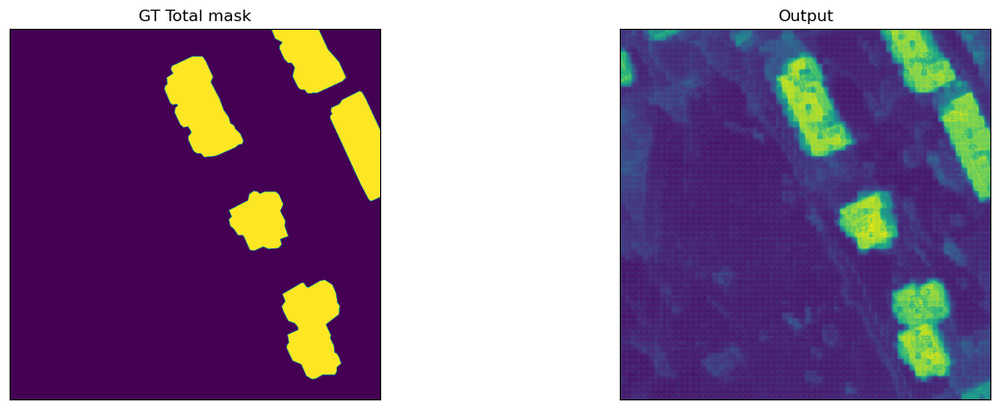

epoch: 4, validloss: 5.1708186492323875
epoch: 4, validloss: 5.1708186492323875
best valid loss: inf


epoch,▁▁▁▁▁▁▁▁▃▃▃▃▃▃▃▃▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆████████
train_loss,▆▃▂▅▂▂▂▁▂▁▂▁▂▂▁▄▂▂▂▁▇▄▂▂▁▁▁▁▁▂▁▂▂▂▁█▂▂▃▂
validation_loss,▃▄▅▄▃▆▃▄▄▄▆▅▆█▄▆▁▂▂▂▂▂▁▁▂▂▂▂▁▁▂▂▂▂▁▂▁▂▁▁
epoch,5
train_loss,0.21812
validation_loss,0.10294


In [30]:
model = train()

In [ ]:
# Save model. Needs to be saved like this because of nn.DataParallel. Otherwise loading model to SamPredictor wont work
# torch.save(model.model.state_dict(), saved_model_path)

# Save model. Need to remove extra model. prefix when running SamPredictor. Removal code is included in inference code.
torch.save(model.state_dict(), saved_model_path)

In [ ]:
#epoch: 19, validloss: 6.244962926954031
# epoch 1 , validloss:

## Predict trained model

Here we assume that you have fine-tuned SAM with the code above and the fine-tuned model is saved as saved_model_path (.pth file)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


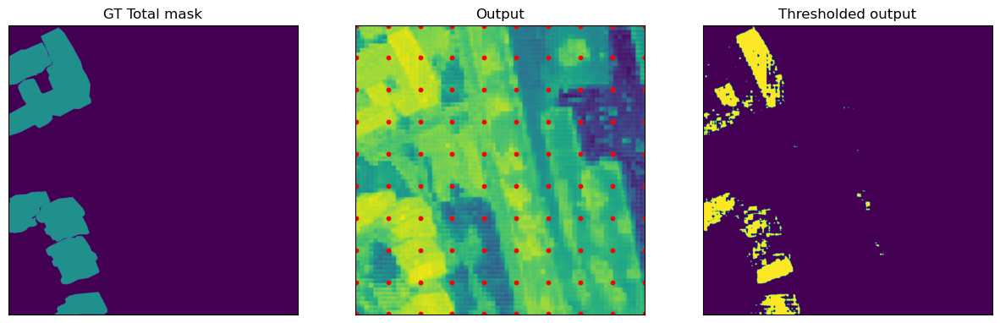

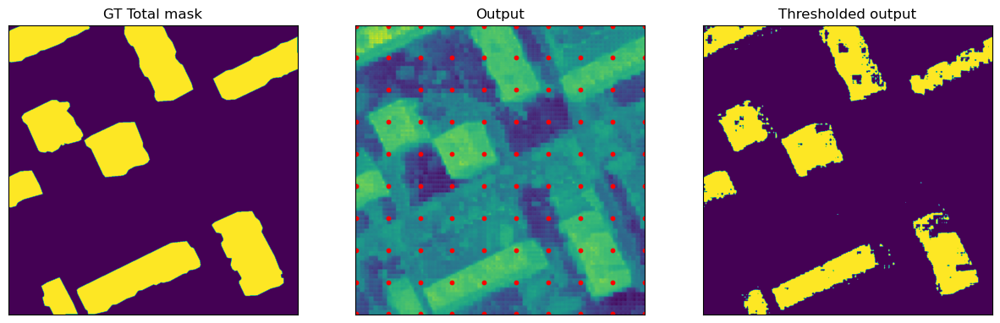

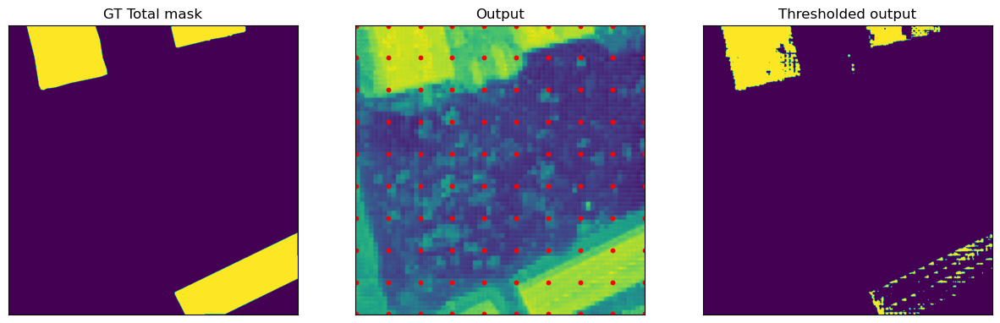

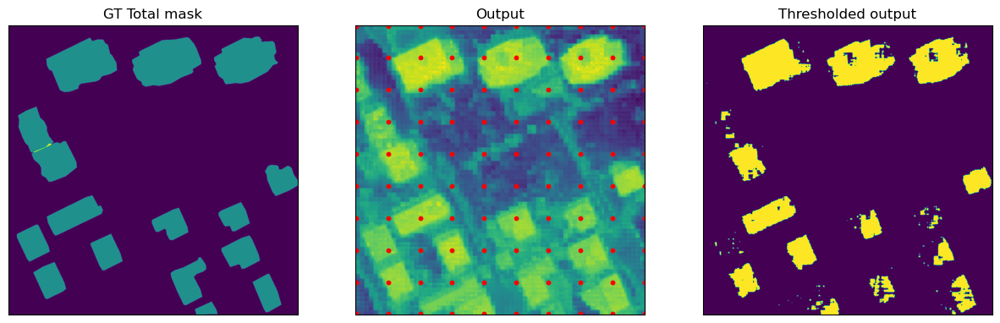

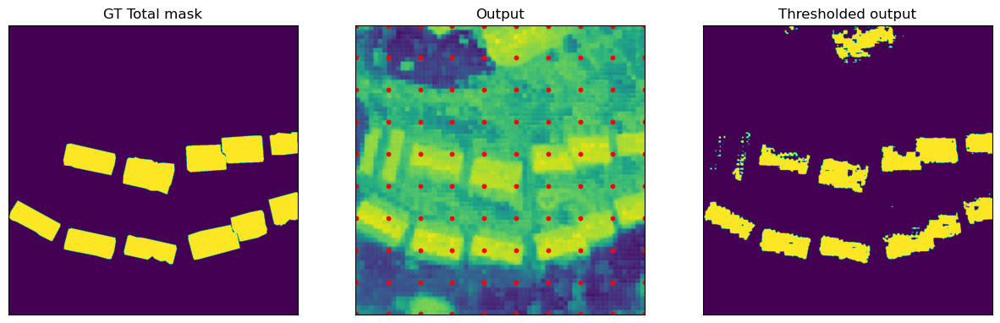

...

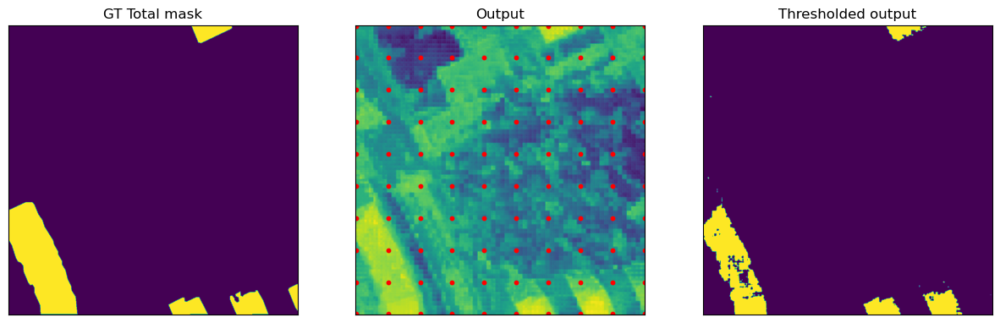

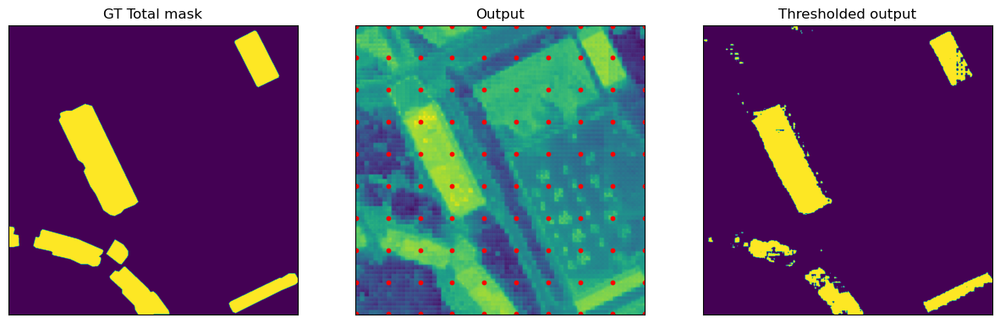

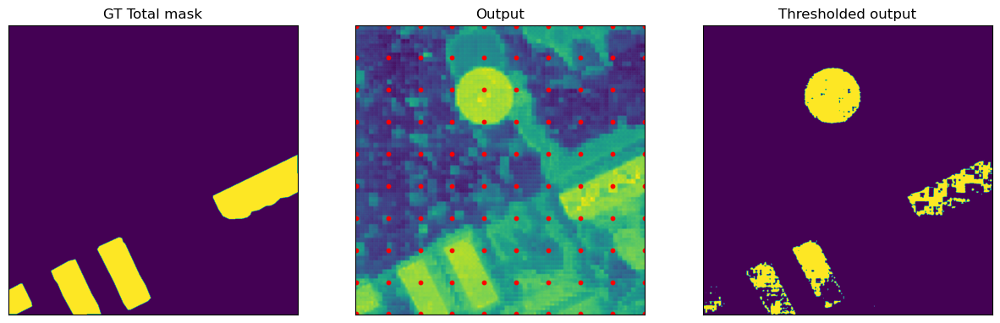

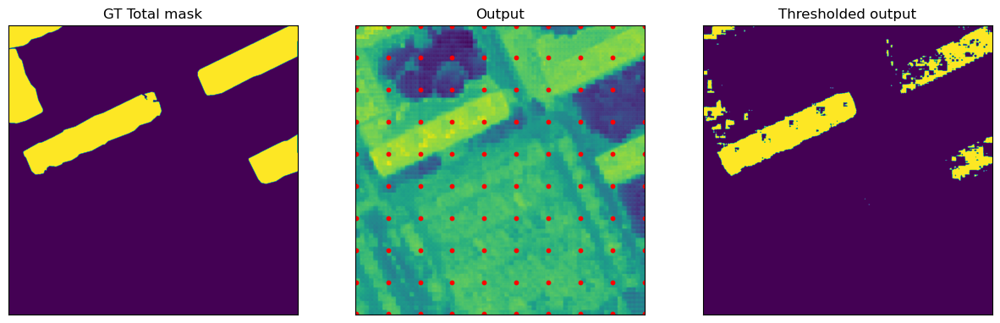

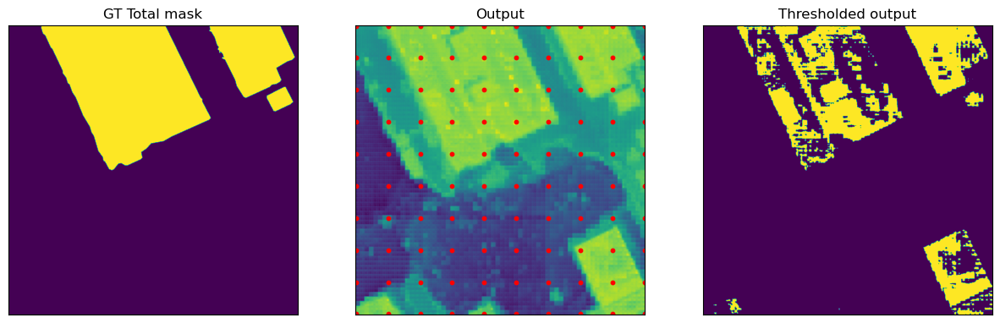

In [ ]:
# Predict trained model, previous method

# Threshold for binarizing the mask
threshold = 0.5

model_trained = ModelSimple()
model_trained.setup()
with torch.inference_mode():
    model_trained.load_state_dict(torch.load(saved_model_path, map_location=torch.device('cpu')))
    model_trained.eval()
    img_size = model_trained.model.image_encoder.img_size
    trainloader, validloader = load_datasets(img_size=img_size)
    for i, (image, path, masks) in enumerate(validloader):

        # Create grid of coordinates for points

        # Define the size of your array
        array_size = 1024

        # Define the size of your grid
        grid_size = 10

        # Generate the grid points
        x = np.linspace(1, array_size-2, grid_size)
        y = np.linspace(1, array_size-2, grid_size)

        # Generate a grid of coordinates
        xv, yv = np.meshgrid(x, y)
        # Convert the numpy arrays to lists
        xv_list = xv.tolist()
        yv_list = yv.tolist()

        # Combine the x and y coordinates into a list of list of lists
        input_points = [[[x_row[i], y_row[i]] for i in range(10) for x_row, y_row in zip(xv_list,yv_list)]]
        point_coords = torch.tensor(input_points)
        point_labels = torch.tensor([np.ones(grid_size**2)])

        # PROVIDE INPUT POINTS AS torch.Tensor [[B x N x 2],[B x N]] B = Batch number , N = Image number
        INPUT_POINTS = (point_coords,point_labels)
        preds, iou = model_trained(image, INPUT_POINTS)
        masks = masks[0].to(DEVICE)
        total_mask = get_totalmask(masks)

        # Binarize mask --> convert soft mask to hard mask
        single_image_prob = torch.sigmoid(preds.squeeze(1))
        single_image_prob = single_image_prob.detach().cpu().numpy().squeeze()
        single_image_prediction = (single_image_prob > threshold).astype(np.uint8)

        # DEBUG: print what comes out of model and compare with GT
        # DEBUG: Get pred numpy array and print it for debug
        pred_np = preds.detach().cpu().numpy().squeeze()
        total_mask_np = total_mask.detach().cpu().numpy().squeeze()
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        # Plot the first image on the left
        axes[0].imshow(total_mask_np)
        axes[0].set_title("GT Total mask")

        # Plot the second image on the right
        axes[1].imshow(pred_np)
        axes[1].set_title("Output")
        x_points = [(x_row[i]) for i in range(10) for x_row in xv_list]
        y_points = [(y_row[i]) for i in range(10) for y_row in yv_list]

        # Overlay used point prompts on second image
        axes[1].scatter(x=x_points, y=y_points, c="r", s=10)

        # Plot the second image on the right
        axes[2].imshow(single_image_prediction)
        axes[2].set_title("Thresholded output")

        # # plot image and lay points on it

        # Hide axis ticks and labels
        for ax in axes:
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xticklabels([])
            ax.set_yticklabels([])

        # Display the images side by side
        plt.show()



loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


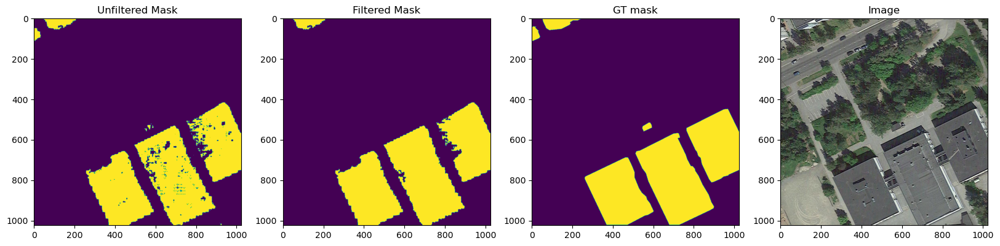

IoU and Dice coefficient:0.844 0.915
mIoU and mean Dice coefficient:0.844 0.915


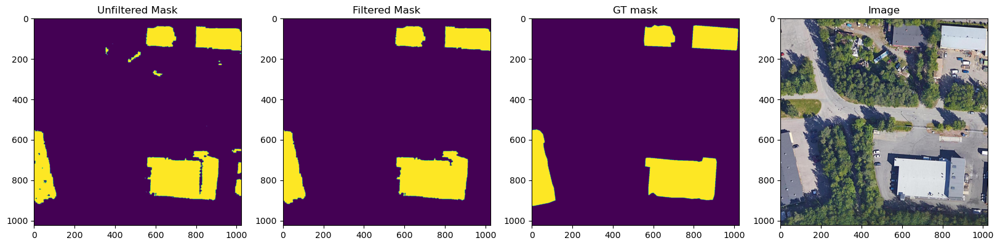

IoU and Dice coefficient:0.901 0.948
mIoU and mean Dice coefficient:0.8725 0.9315


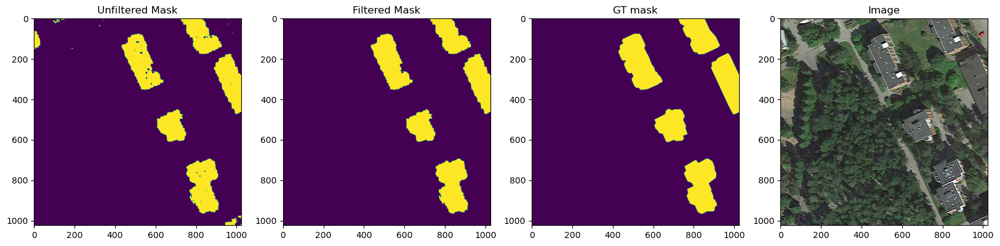

IoU and Dice coefficient:0.885 0.939
mIoU and mean Dice coefficient:0.8766666666666666 0.934


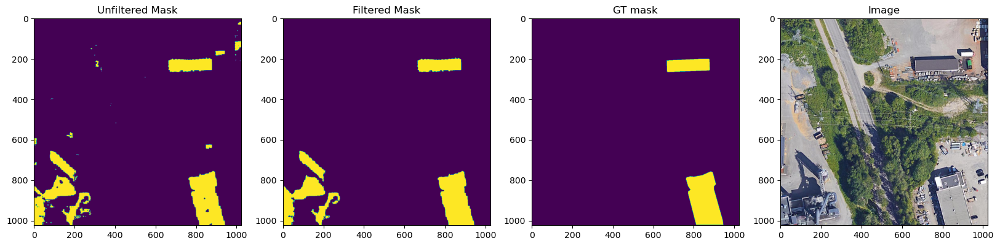

IoU and Dice coefficient:0.545 0.705
mIoU and mean Dice coefficient:0.79375 0.87675


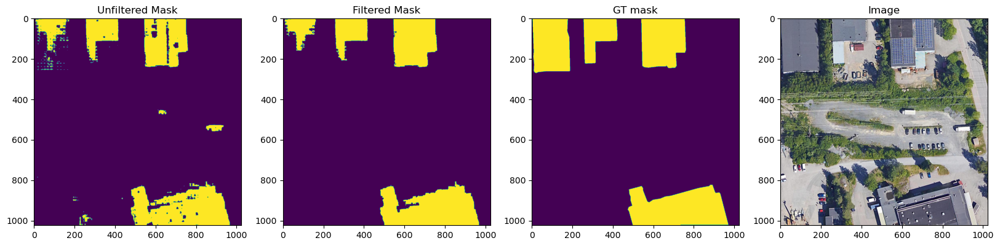

IoU and Dice coefficient:0.773 0.872
mIoU and mean Dice coefficient:0.7896 0.8758000000000001


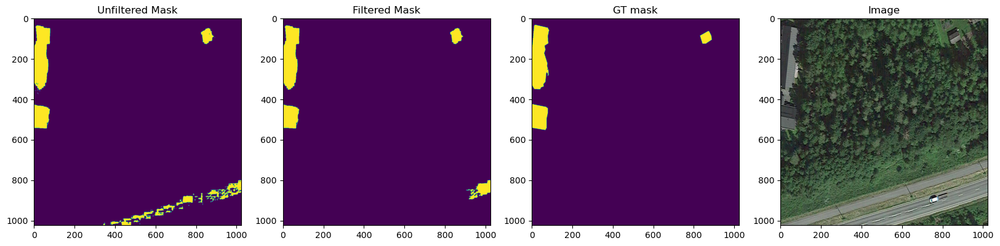

IoU and Dice coefficient:0.76 0.864
mIoU and mean Dice coefficient:0.7846666666666667 0.8738333333333334


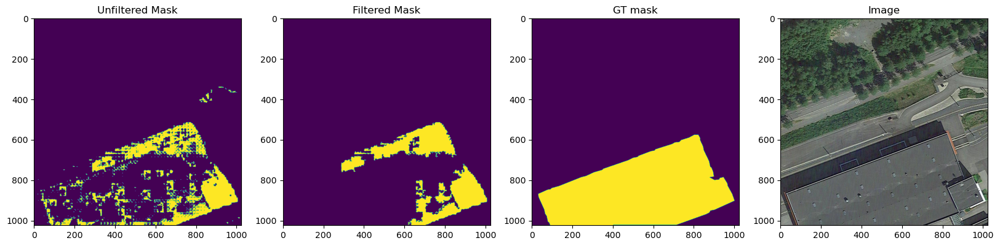

IoU and Dice coefficient:0.18 0.305
mIoU and mean Dice coefficient:0.6982857142857143 0.7925714285714286


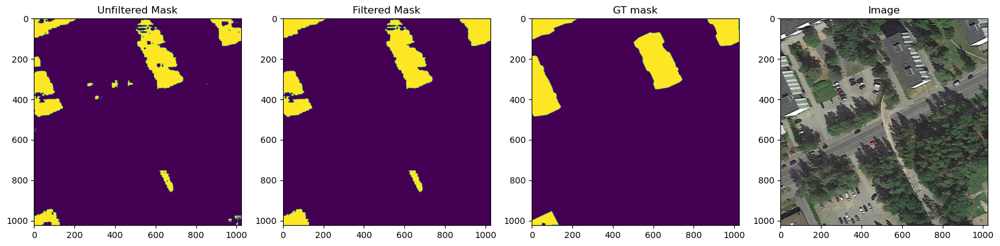

IoU and Dice coefficient:0.773 0.872
mIoU and mean Dice coefficient:0.707625 0.8025


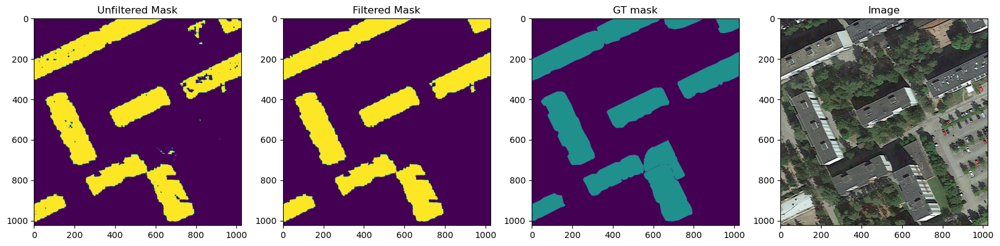

IoU and Dice coefficient:0.835 0.91
mIoU and mean Dice coefficient:0.7217777777777777 0.8144444444444444


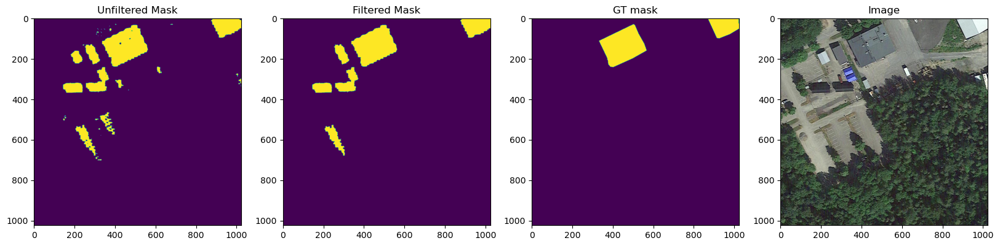

IoU and Dice coefficient:0.625 0.769
mIoU and mean Dice coefficient:0.7121 0.8099000000000001


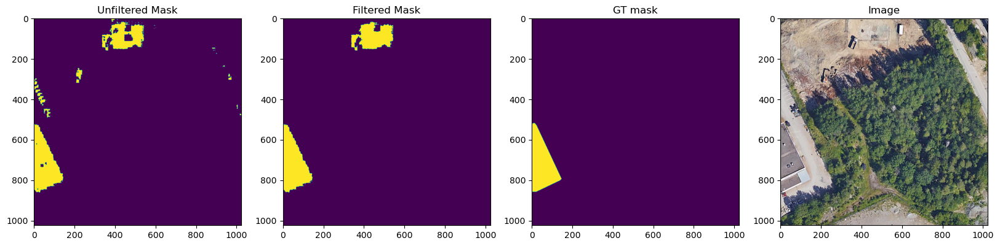

IoU and Dice coefficient:0.583 0.736
mIoU and mean Dice coefficient:0.7003636363636363 0.8031818181818182


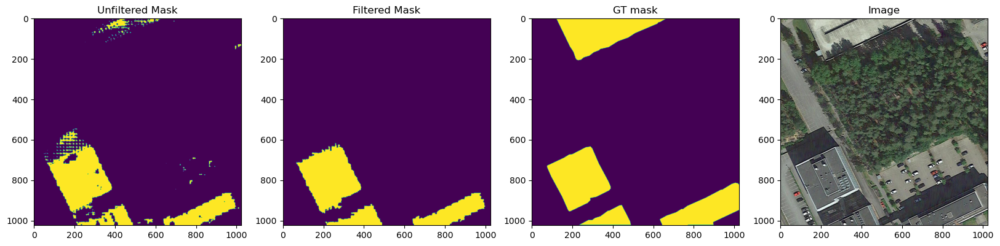

IoU and Dice coefficient:0.539 0.7
mIoU and mean Dice coefficient:0.6869166666666667 0.7945833333333333


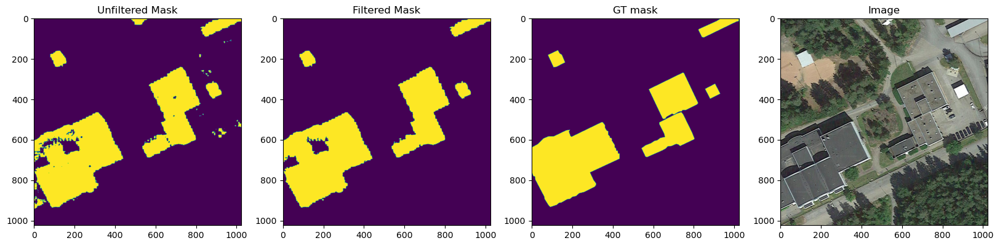

IoU and Dice coefficient:0.811 0.896
mIoU and mean Dice coefficient:0.6964615384615385 0.8023846153846155


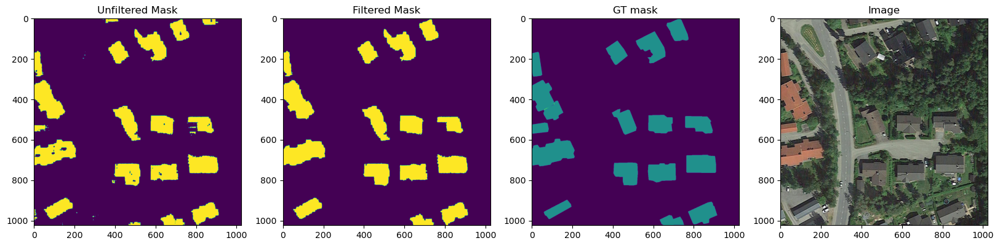

IoU and Dice coefficient:0.825 0.904
mIoU and mean Dice coefficient:0.7056428571428571 0.8096428571428572


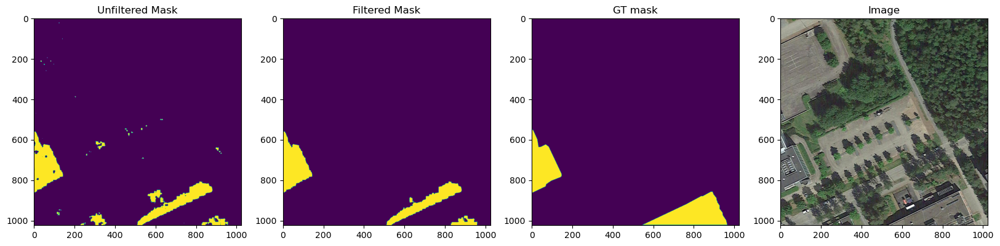

IoU and Dice coefficient:0.34 0.508
mIoU and mean Dice coefficient:0.6812666666666666 0.7895333333333333


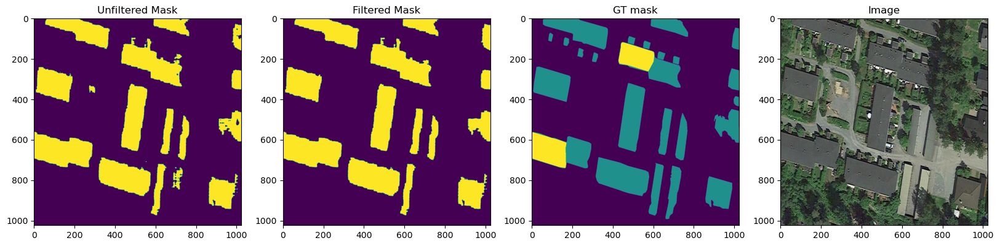

IoU and Dice coefficient:0.983 0.992
mIoU and mean Dice coefficient:0.700125 0.8021875


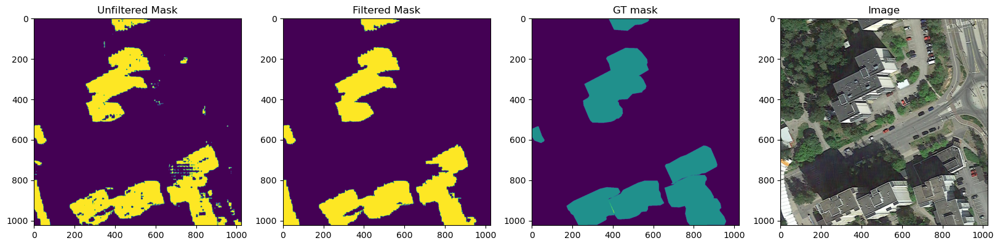

IoU and Dice coefficient:0.749 0.856
mIoU and mean Dice coefficient:0.7030000000000001 0.8053529411764706


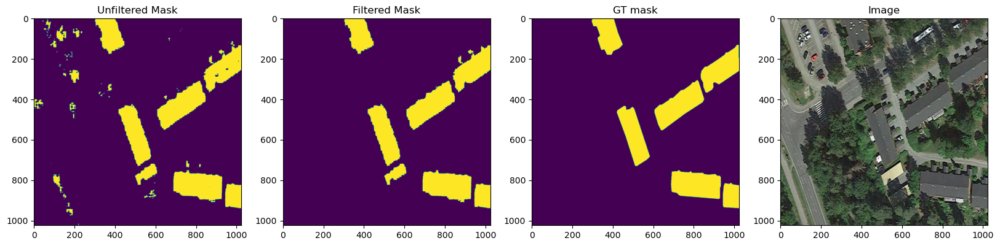

IoU and Dice coefficient:0.884 0.939
mIoU and mean Dice coefficient:0.7130555555555556 0.8127777777777778


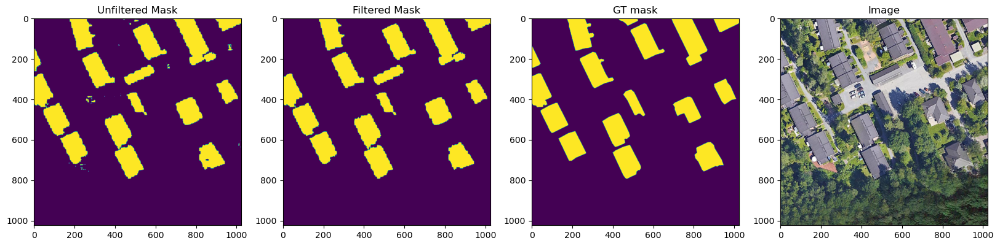

IoU and Dice coefficient:0.834 0.91
mIoU and mean Dice coefficient:0.719421052631579 0.8178947368421053


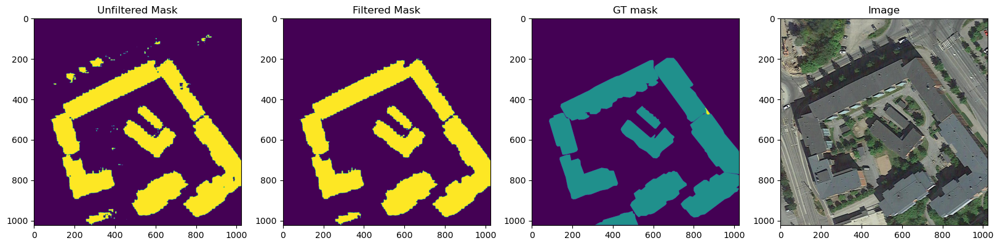

IoU and Dice coefficient:0.81 0.895
mIoU and mean Dice coefficient:0.7239500000000001 0.8217500000000001


In [39]:
# Predict trained model using SamPredictor, new better method

# Threshold for removing small regions
min_area = 3000

# Mean IoU and Dice coefficient
iou_sum = 0
miou = 0
dice_sum = 0
mdice = 0

from segment_anything import sam_model_registry, SamPredictor, SamAutomaticMaskGenerator

with torch.inference_mode():
    # Load the state dictionary, accounting for the 'model' prefix
    state_dict = torch.load(saved_model_path, map_location=torch.device('cpu'))

    # Remove the 'model.' prefix from the state dictionary keys
    new_state_dict = {k[6:]: v for k, v in state_dict.items() if k.startswith('model.')}

    # Create a new model instance
    sam = sam_model_registry['vit_h'](model_path).to(device=DEVICE)

    # Load the modified state dictionary
    sam.load_state_dict(new_state_dict)

    # Initialize SamPredictor
    mask_predictor = SamPredictor(sam)

    # Load datasets
    img_size = sam.image_encoder.img_size
    trainloader, validloader, testloader = load_datasets(img_size=img_size)

    # Predict masks of validation images using SamPredictor
    for i, (image, path, gt_masks) in enumerate(testloader):

        # Modify image to accepted form
        image = np.array(image)
        image = image.squeeze(0)*255
        image = image.astype(np.uint8)
        image = np.transpose(image, (1,2,0))

        # Set image to be processed
        mask_predictor.set_image(image)

        #CREATE grid of coordinates for points

        # Define the size of your array
        array_size = 1024
        grid_size = 10

        # Generate the grid points
        x = np.linspace(1, array_size-2, grid_size)
        y = np.linspace(1, array_size-2, grid_size)

        # Generate a grid of coordinates
        xv, yv = np.meshgrid(x, y)

        # Convert the numpy arrays to lists
        xv_list = xv.tolist()
        yv_list = yv.tolist()

        # Provide points as input prompt [X,Y]-coordinates
        input_points = np.array([[x_row[i], y_row[i]] for i in range(10) for x_row, y_row in zip(xv_list,yv_list)])
        input_label = np.array(np.ones(grid_size**2))

        # Get total groundtruth masks
        total_mask = get_totalmask(gt_masks[0])
        total_mask_np = total_mask.detach().cpu().numpy().squeeze()

        # Predict the segmentation mask at that point
        masks, scores, logits = mask_predictor.predict(
        point_coords=input_points,
        point_labels=input_label,
        multimask_output=False,
        )

        # Unfiltered mask transposed to correct shape for remove_small_regions
        masks_uf = np.transpose(masks,(1,2,0))

        # Filter small disconnected regions and holes
        masks, changed = remove_small_regions(masks_uf, min_area, mode="holes") #FIXED, WORKING NOW
        masks, changed = remove_small_regions(masks, min_area, mode="islands") # FIXED, WORKING NOW

        # Plot masks and images
        fig, axes = plt.subplots(1, 4, figsize=(20, 10))
        axes[0].imshow(masks_uf)
        axes[0].set_title("Unfiltered Mask")
        axes[1].imshow(masks)
        axes[1].set_title("Filtered Mask")
        axes[2].imshow(total_mask_np)
        axes[2].set_title("GT mask")
        axes[3].imshow(image)
        axes[3].set_title("Image")
        x_points = [(x_row[i]) for i in range(10) for x_row in xv_list]
        y_points = [(y_row[i]) for i in range(10) for y_row in yv_list]
        # Overlay used point prompts on second image
        # axes[3].scatter(x=x_points, y=y_points, c="r", s=10)
        plt.show()

        # Compute IoU and Dice coefficient
        iou = IoU(total_mask_np, masks)
        dice = dice_coef(total_mask_np,masks)
        iou_sum += iou
        miou = iou_sum / (i+1)
        dice_sum += dice
        mdice = dice_sum / (i+1)
        print(f'IoU and Dice coefficient:{iou} {dice}')
        print(f'mIoU and mean Dice coefficient:{miou} {mdice}')



Text(0.5, 1.0, 'Image')

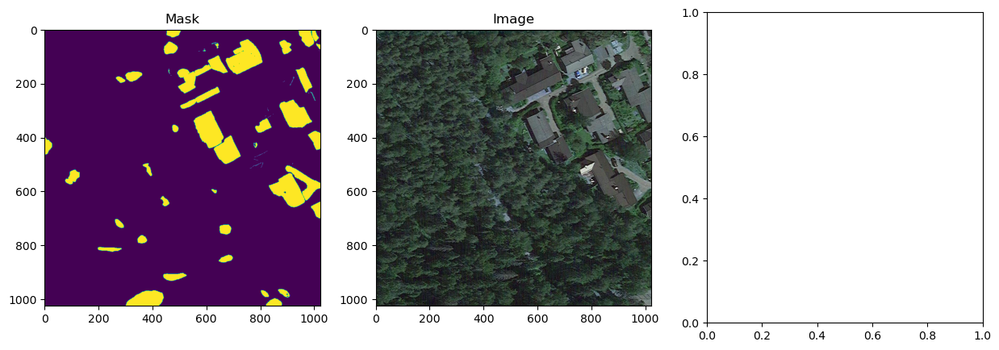

In [ ]:
# Predict using SamAutomaticMaskGenerator. DEBUGGING remove small regions function
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
sam = sam_model_registry['vit_h'](model_path).to(device=DEVICE)
mask_generator = SamAutomaticMaskGenerator(sam)
sample_image = cv2.imread(sample_path)
masks = mask_generator.generate(sample_image)

from typing import List, Dict, Any
def build_totalmask(pred: List[Dict[str, Any]]) -> np.ndarray:
    """Builds a total mask from a list of segmentations
    ARGS:
        pred (list): list of dicts with keys 'segmentation' and others
    RETURNS:
        total_mask (np.ndarray): total mask

    """

    total_mask = np.zeros(pred[0]['segmentation'].shape, dtype=np.uint8)
    for seg in pred:
        total_mask += seg['segmentation']
    _, total_mask = cv2.threshold(total_mask, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)


    return total_mask

tmask = build_totalmask(masks)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(tmask)
axes[0].set_title("Mask")
axes[1].imshow(sample_image)
axes[1].set_title("Image")
